In [2]:
import librosa
import numpy as np
import json
import matplotlib.pyplot as plt
import os
import cv2

from whistle_prompter.utils import audio

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
def process_long_audio(
    audio_path,
    segment_length=3,
    overlap=1.5,
    n_fft=1536,
    hop_length=256,
    center=True,
):
    y, sr = librosa.load(audio_path, sr=None)
    total_samples = len(y)
    segment_samples = int(segment_length * sr)
    overlap_samples = int(overlap * sr)

    segments = []
    start = 0
    segment_idx = 0
    for segment_idx, start in enumerate(range(0, total_samples - segment_samples + 1, segment_samples - overlap_samples)):
        end = start + segment_samples
        y_segment = y[start:end]
        # 1. normalize waveform
        y_segment = y_segment / np.max(np.abs(y_segment))
        # 2. spectrogram
        S = librosa.stft(
            y_segment,
            n_fft=n_fft,
            hop_length=hop_length,
            win_length= n_fft,
            window='hann',
            center=center,
            pad_mode='constant',
        )
        S_db = librosa.amplitude_to_db(np.abs(S), amin=1e-5, ref=np.max, top_db = 80)
        # 3. normalize spectrogram
        S_db = (S_db - S_db.mean()) / S_db.std()
        S_db = np.clip(S_db, -3, 3) 
        S_db = (S_db - np.min(S_db)) / (np.max(S_db) - np.min(S_db))
        # S_db = (S_db*255).astype(np.uint8)
        # clahe = cv2.createCLAHE(clipLimit=3, tileGridSize=(8,8))
        # S_db = clahe.apply(S_db)
        S_db = np.flip(S_db, -2)
        # 4. save spectrogram
        filename = f"{os.path.splitext(os.path.basename(audio_path))[0]}_segment_{segment_idx}.png"
        plot_spec(S_db, filename= filename, save_dir="outputs/spectrograms", pix_tick=False, axis=False, dpi=300)    

        # Update indices
        start += (segment_samples - overlap_samples)
        segment_idx += 1

    return segments

In [61]:
audio_path = '/home/xzhang3906/Desktop/projects/whistle_prompter/data/audio/QX-Dc-FLIP0610-VLA-061015-165000.wav'

-11.194191 5.513271 1.2711298e-07 1.0000001 0.09117216
0.0076778189800532515 0.002646986520969881
0.0 1.0 0.50058603 0.16273126 0.51519537



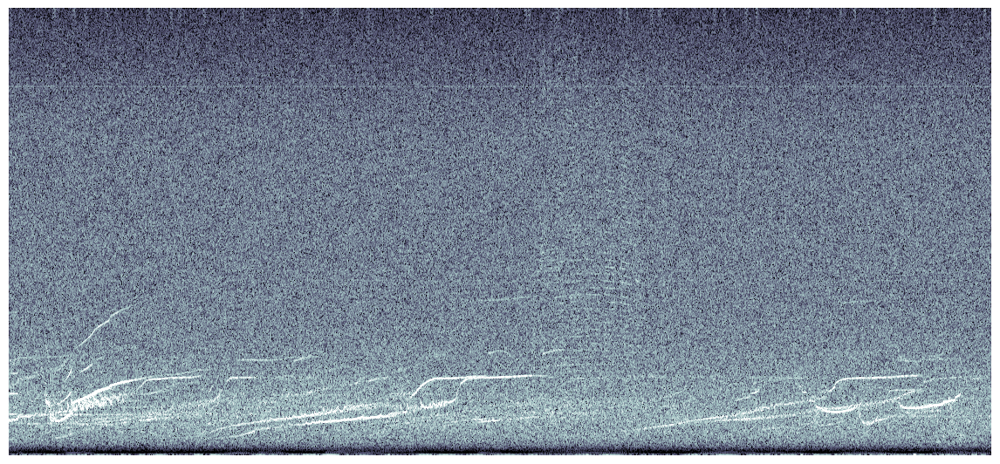

1


In [29]:
audio.process_long_audio(audio_path)

-11.194191 5.513271 1.2711298e-07 1.0000001 0.09117216
0.0076778189800532515 0.002646986520969881
0.0 1.0 0.5176367 0.12008362 0.52303225



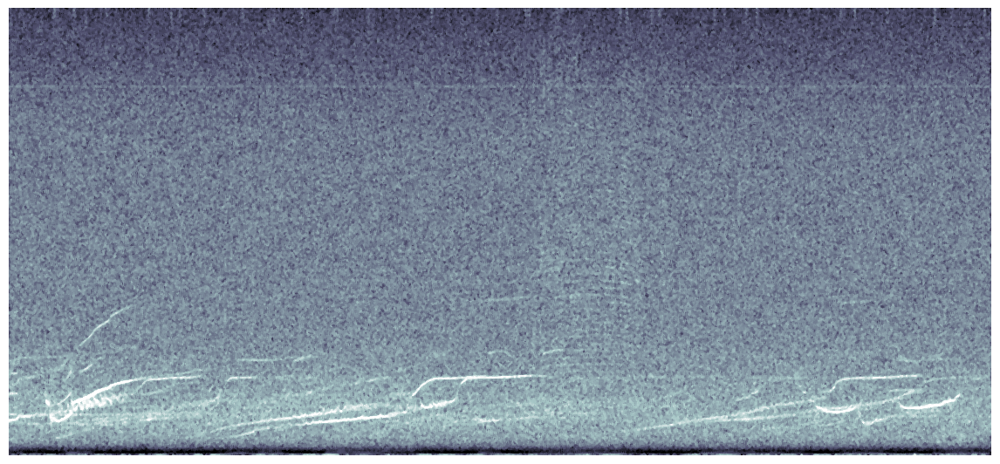

1


In [ ]:
audio.process_long_audio(audio_path) # median blur

-11.194191 5.513271 1.2711298e-07 1.0000001 0.09117216
0.0076778189800532515 0.002646986520969881
0 255 132.7391653596197 60.3991119926943 139.0



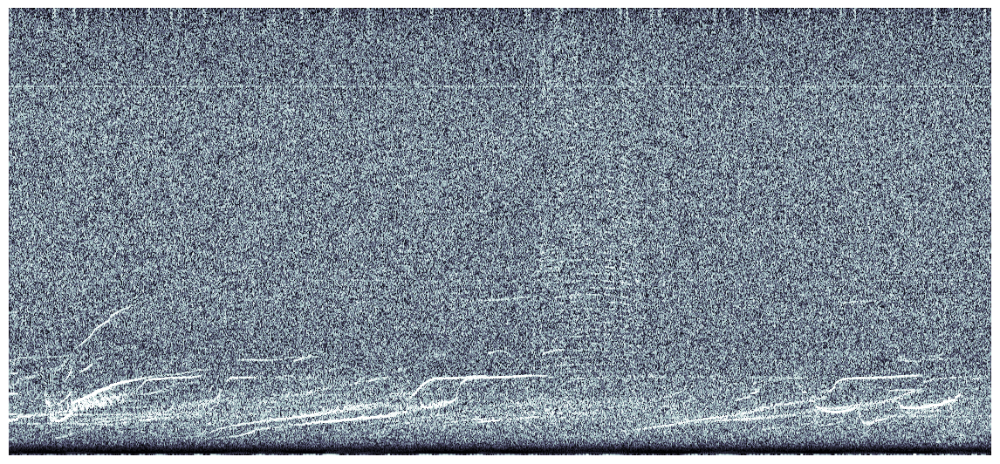

1


In [28]:
audio.process_long_audio(audio_path) # CLAHE 


In [41]:
audio_path = '/home/xzhang3906/Desktop/projects/whistle_prompter/data/audio/Qx-Dc-CC0411-TAT11-CH2-041114-154040-s.wav'


-5.0608706 7.573447 -7.2527314e-07 1.0 -0.17537469
0.0009331103563131234 0.015388530532963551
0.0 1.0 0.4977314 0.15747827 0.4707709



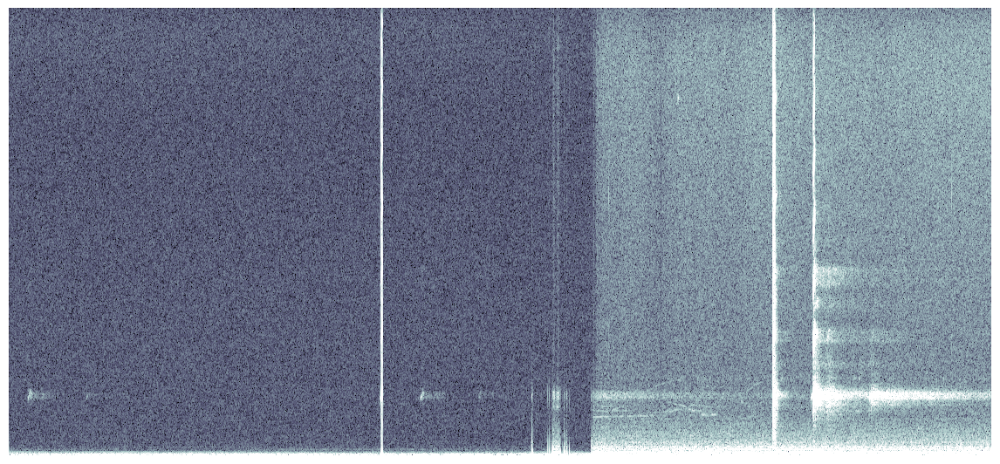

1


In [5]:
audio.process_long_audio(audio_path)


-5.0608706 7.573447 -7.2527314e-07 1.0 -0.17537469
0.0009331103563131234 0.015388530532963551
0.15821914 1.0 0.5319888 0.13813108 0.46831298



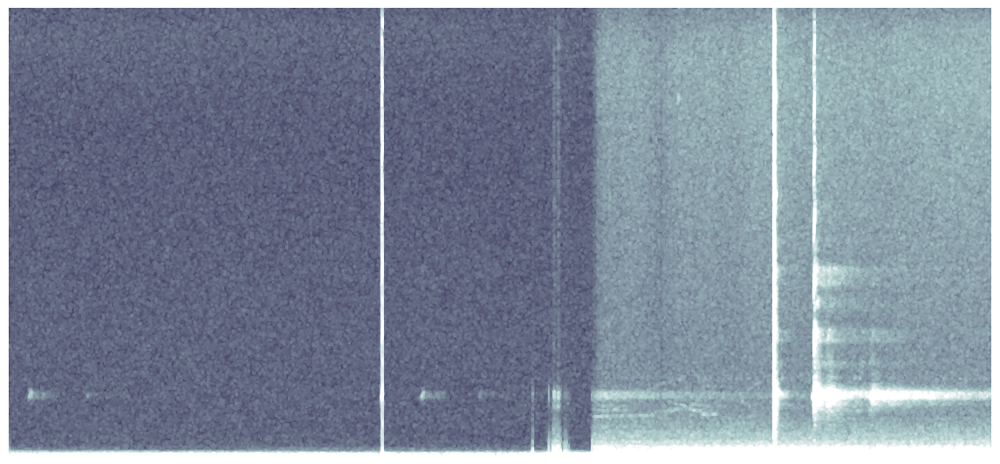

1


In [4]:
audio.process_long_audio(audio_path) # median blur + dilate

-0.4465727 11.729416 -4.7286453e-06 1.0 -0.4465727
0.0 0.024472074205644366
3 255 43.43379071321485 70.22648328895754 4.0



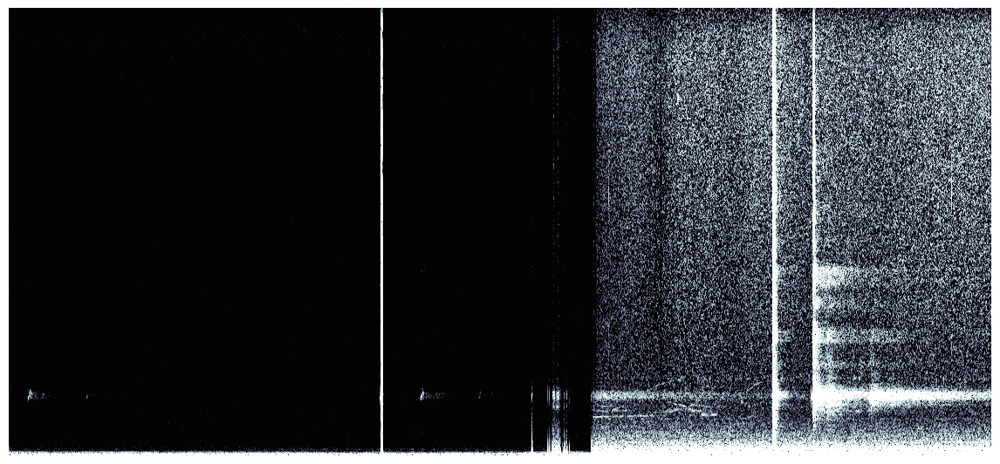

1


In [60]:
audio.process_long_audio(audio_path) # CLAHE 

-5.0608706 7.573447 -7.2527314e-07 1.0 -0.17537469
0.0009331103563131234 0.015388530532963551
21 255 138.94212638365204 40.524947836018754 136.0



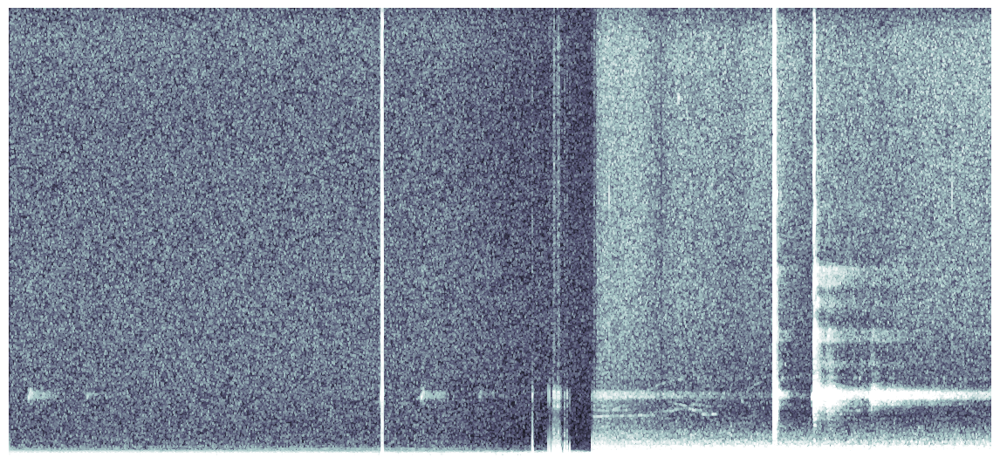

1


In [8]:
audio.process_long_audio(audio_path) # dilate+ CLAHE 
